In [ ]:
%pylab inline
from numba import jit,njit, vectorize
import dataframe_image as dfi


In [18]:
from mpl_toolkits import mplot3d

In [19]:
import pandas as pd
import numpy as np
import plotly as py
import plotly.tools as tls
import cufflinks as cf
from plotly.offline import iplot
import os
os.environ["KERAS_BACKEND"] = "plaidml.keras.backend"
import matplotlib.pyplot as plt
import os
import plotly.express as px

In [20]:
py.offline.init_notebook_mode(connected=True)
cf.go_offline()

In [24]:
st=pd.read_csv("https://raw.githubusercontent.com/shinejil/covid-19-analysis-and-forecasting-with-powerbi/main/covid%2019%20analysis%20and%20forecasting/state_wise%20raw%20data%20.csv")
st

,Date,Date_YMD,Status,TT,AN,AP,AR,AS,BR,CH,...,PB,RJ,SK,TN,TG,TR,UP,UT,WB,UN
0,14-Mar-20,2020-03-14,Confirmed,81,0,1,0,0,0,0,...,1,3,0,1,1,0,12,0,0,0
1,14-Mar-20,2020-03-14,Recovered,9,0,0,0,0,0,0,...,0,1,0,0,0,0,4,0,0,0
2,14-Mar-20,2020-03-14,Deceased,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,15-Mar-20,2020-03-15,Confirmed,27,0,0,0,0,0,0,...,0,1,0,0,2,0,1,0,0,0
4,15-Mar-20,2020-03-15,Recovered,4,0,0,0,0,0,0,...,0,2,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1786,30-Oct-21,2021-10-30,Recovered,14672,1,535,10,371,2,2,...,27,1,3,1172,191,8,9,6,880,0
1787,30-Oct-21,2021-10-30,Deceased,445,0,2,0,4,0,0,...,1,0,0,14,1,0,0,0,13,0
1788,31-Oct-21,2021-10-31,Confirmed,12907,0,385,1,212,8,5,...,26,2,21,1009,121,12,6,5,914,0
1789,31-Oct-21,2021-10-31,Recovered,13152,0,675,9,236,9,3,...,25,2,8,1183,183,2,6,9,913,0


In [25]:
st.rename(columns={'AP':'Andhra Pradesh','AR':'Arunachal Pradesh','AS':'Assam','BR':'Bihar','AN':'Andaman and Nicobar','CH':'Chandigarh','CT':'Chhattisgarh','DN':'Dadra and Nagar Haveli','DD':'Daman and Diu','DL':'Delhi','GA':'Goa','GJ':'Gujarat','HR':'Haryana','HP':'Himachal Pradesh','JH':'Jharkhand','JK':'Jammu and Kashmir','KA':'Karnataka','KL':'Kerala','LD':'Lakshadweep','MP':'Madhya Pradesh','MH':'Maharastra','MN':'Manipur','ML':'Meghalaya','MZ':'Mizoram','NL':'Nagaland','OR':'Orissa','PY':'Pondicherry','PB':'Punjab','RJ':'Rajasthan','SK':'Sikkim','TN':'Tamil Nadu','TR':'Tripura','TG':'Telangana','UP':'Uttar Pradesh','UT':'Uttarakhand','WB':'West Bengal'},inplace=True)
st.drop(['TT','UN','LA'],axis=1,inplace=True)

In [26]:
st

,Date,Date_YMD,Status,Andaman and Nicobar,Andhra Pradesh,Arunachal Pradesh,Assam,Bihar,Chandigarh,Chhattisgarh,...,Pondicherry,Punjab,Rajasthan,Sikkim,Tamil Nadu,Telangana,Tripura,Uttar Pradesh,Uttarakhand,West Bengal
0,14-Mar-20,2020-03-14,Confirmed,0,1,0,0,0,0,0,...,0,1,3,0,1,1,0,12,0,0
1,14-Mar-20,2020-03-14,Recovered,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,4,0,0
2,14-Mar-20,2020-03-14,Deceased,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,15-Mar-20,2020-03-15,Confirmed,0,0,0,0,0,0,0,...,0,0,1,0,0,2,0,1,0,0
4,15-Mar-20,2020-03-15,Recovered,0,0,0,0,0,0,0,...,0,0,2,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1786,30-Oct-21,2021-10-30,Recovered,1,535,10,371,2,2,17,...,48,27,1,3,1172,191,8,9,6,880
1787,30-Oct-21,2021-10-30,Deceased,0,2,0,4,0,0,1,...,0,1,0,0,14,1,0,0,0,13
1788,31-Oct-21,2021-10-31,Confirmed,0,385,1,212,8,5,32,...,38,26,2,21,1009,121,12,6,5,914
1789,31-Oct-21,2021-10-31,Recovered,0,675,9,236,9,3,32,...,45,25,2,8,1183,183,2,6,9,913


In [27]:
"""
import matplotlib.pyplot as plt
import pandas as pd
from pandas.plotting import table # EDIT: see deprecation warnings below

ax = plt.subplot(111, frame_on=False) # no visible frame
ax.xaxis.set_visible(False)  # hide the x axis
ax.yaxis.set_visible(False)  # hide the y axis

table(ax, st)  

plt.savefig('datanamechanged.png')
"""

"\nimport matplotlib.pyplot as plt\nimport pandas as pd\nfrom pandas.plotting import table # EDIT: see deprecation warnings below\n\nax = plt.subplot(111, frame_on=False) # no visible frame\nax.xaxis.set_visible(False)  # hide the x axis\nax.yaxis.set_visible(False)  # hide the y axis\n\ntable(ax, st)  \n\nplt.savefig('datanamechanged.png')\n"

In [ ]:
#dfi.export(st,"mytable.png")

In [28]:
State_wise= pd.melt(st, id_vars=['Date', 'Date_YMD', 'Status'], var_name=['States'])
print("The Shape of st is: ", st.shape)

The Shape of st is:  (1791, 39)


In [29]:
State_wise

,Date,Date_YMD,Status,States,value
0,14-Mar-20,2020-03-14,Confirmed,Andaman and Nicobar,0
1,14-Mar-20,2020-03-14,Recovered,Andaman and Nicobar,0
2,14-Mar-20,2020-03-14,Deceased,Andaman and Nicobar,0
3,15-Mar-20,2020-03-15,Confirmed,Andaman and Nicobar,0
4,15-Mar-20,2020-03-15,Recovered,Andaman and Nicobar,0
...,...,...,...,...,...
64471,30-Oct-21,2021-10-30,Recovered,West Bengal,880
64472,30-Oct-21,2021-10-30,Deceased,West Bengal,13
64473,31-Oct-21,2021-10-31,Confirmed,West Bengal,914
64474,31-Oct-21,2021-10-31,Recovered,West Bengal,913


In [10]:
#State_wise.to_csv('State_wise.csv')

In [11]:
#from sklearn.preprocessing import LabelEncoder

#label_encoder = LabelEncoder()
#State_wise['Status'] = label_encoder.fit_transform(State_wise['Status'])
#State_wise

In [12]:
#label_encoder.classes_

In [13]:
#State_wise

In [30]:
X = State_wise['Status'].values.reshape(-1,1)

In [31]:
from sklearn.preprocessing import OneHotEncoder

onehot_encoder = OneHotEncoder()
X = onehot_encoder.fit_transform(X).toarray()
X

array([[1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       ...,
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.]])

In [14]:
X.shape

(64476, 3)

In [32]:
onehot_encoder.categories_

[array(['Confirmed', 'Deceased', 'Recovered'], dtype=object)]

In [33]:
st_onehot = pd.DataFrame(X, columns=[str(i) for i in range(X.shape[1])])
st_onehot

,0,1,2
0,1.0,0.0,0.0
1,0.0,0.0,1.0
2,0.0,1.0,0.0
3,1.0,0.0,0.0
4,0.0,0.0,1.0
...,...,...,...
64471,0.0,0.0,1.0
64472,0.0,1.0,0.0
64473,1.0,0.0,0.0
64474,0.0,0.0,1.0


In [34]:
st= pd.concat([st_onehot, State_wise], axis=1)
st

,0,1,2,Date,Date_YMD,Status,States,value
0,1.0,0.0,0.0,14-Mar-20,2020-03-14,Confirmed,Andaman and Nicobar,0
1,0.0,0.0,1.0,14-Mar-20,2020-03-14,Recovered,Andaman and Nicobar,0
2,0.0,1.0,0.0,14-Mar-20,2020-03-14,Deceased,Andaman and Nicobar,0
3,1.0,0.0,0.0,15-Mar-20,2020-03-15,Confirmed,Andaman and Nicobar,0
4,0.0,0.0,1.0,15-Mar-20,2020-03-15,Recovered,Andaman and Nicobar,0
...,...,...,...,...,...,...,...,...
64471,0.0,0.0,1.0,30-Oct-21,2021-10-30,Recovered,West Bengal,880
64472,0.0,1.0,0.0,30-Oct-21,2021-10-30,Deceased,West Bengal,13
64473,1.0,0.0,0.0,31-Oct-21,2021-10-31,Confirmed,West Bengal,914
64474,0.0,0.0,1.0,31-Oct-21,2021-10-31,Recovered,West Bengal,913


In [19]:
#State_wise2 = st.drop(['Status'], axis=1)
#State_wise2


In [35]:
st.rename(columns={'0':'Confiremed','1':'Deceased','2':'Recovered'},inplace=True)

In [36]:
st

,Confiremed,Deceased,Recovered,Date,Date_YMD,Status,States,value
0,1.0,0.0,0.0,14-Mar-20,2020-03-14,Confirmed,Andaman and Nicobar,0
1,0.0,0.0,1.0,14-Mar-20,2020-03-14,Recovered,Andaman and Nicobar,0
2,0.0,1.0,0.0,14-Mar-20,2020-03-14,Deceased,Andaman and Nicobar,0
3,1.0,0.0,0.0,15-Mar-20,2020-03-15,Confirmed,Andaman and Nicobar,0
4,0.0,0.0,1.0,15-Mar-20,2020-03-15,Recovered,Andaman and Nicobar,0
...,...,...,...,...,...,...,...,...
64471,0.0,0.0,1.0,30-Oct-21,2021-10-30,Recovered,West Bengal,880
64472,0.0,1.0,0.0,30-Oct-21,2021-10-30,Deceased,West Bengal,13
64473,1.0,0.0,0.0,31-Oct-21,2021-10-31,Confirmed,West Bengal,914
64474,0.0,0.0,1.0,31-Oct-21,2021-10-31,Recovered,West Bengal,913


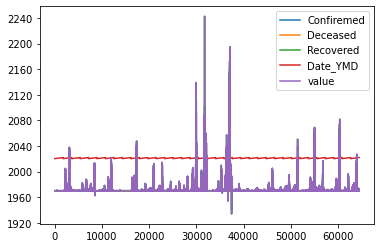

In [49]:
st.plot()
plt.savefig("D:\codes\line.png")

In [23]:
#st["Con"]=np.where(st["Confiremed"]==1,st["value"],st["Confiremed"])


In [37]:
st['Confiremed']=st.apply(lambda x:x['value']if x['Confiremed']==1 else x['Confiremed'],axis=1)
st['Deceased']=st.apply(lambda x:x['value']if x['Deceased']==1 else x['Deceased'],axis=1)
st['Recovered']=st.apply(lambda x:x['value']if x['Recovered']==1 else x['Recovered'],axis=1)
st.tail()

,Confiremed,Deceased,Recovered,Date,Date_YMD,Status,States,value
64471,0.0,0.0,880.0,30-Oct-21,2021-10-30,Recovered,West Bengal,880
64472,0.0,13.0,0.0,30-Oct-21,2021-10-30,Deceased,West Bengal,13
64473,914.0,0.0,0.0,31-Oct-21,2021-10-31,Confirmed,West Bengal,914
64474,0.0,0.0,913.0,31-Oct-21,2021-10-31,Recovered,West Bengal,913
64475,0.0,15.0,0.0,31-Oct-21,2021-10-31,Deceased,West Bengal,15


In [25]:
#st.sort_values("Date", inplace=True)
#st

In [26]:
#st.drop_duplicates(subset ="Date",
                     #keep = False, inplace = True)


In [38]:
st.drop(['Status'],axis=1,inplace=True)


In [39]:
st

,Confiremed,Deceased,Recovered,Date,Date_YMD,States,value
0,0.0,0.0,0.0,14-Mar-20,2020-03-14,Andaman and Nicobar,0
1,0.0,0.0,0.0,14-Mar-20,2020-03-14,Andaman and Nicobar,0
2,0.0,0.0,0.0,14-Mar-20,2020-03-14,Andaman and Nicobar,0
3,0.0,0.0,0.0,15-Mar-20,2020-03-15,Andaman and Nicobar,0
4,0.0,0.0,0.0,15-Mar-20,2020-03-15,Andaman and Nicobar,0
...,...,...,...,...,...,...,...
64471,0.0,0.0,880.0,30-Oct-21,2021-10-30,West Bengal,880
64472,0.0,13.0,0.0,30-Oct-21,2021-10-30,West Bengal,13
64473,914.0,0.0,0.0,31-Oct-21,2021-10-31,West Bengal,914
64474,0.0,0.0,913.0,31-Oct-21,2021-10-31,West Bengal,913


In [61]:
st.iplot(kind='bar',y='Confiremed',x='States')

In [65]:
st.iplot(kind='bar',y='Recovered',x='States',color="#bcbd22")

In [66]:
st.iplot(kind='bar',y='Deceased',x='States',color="red")

In [41]:
Recover=st.loc[(st['States'] == "Kerala") & (st["Recovered"] >0)]
Recover=pd.DataFrame(Recover[["Recovered","Date_YMD"]])
Recover=Recover.set_index("Date_YMD")
#Recover=Recover.drop(["Confiremed","Deceased"],axis=1)
#Recover=Recover.set_index("Date_YMD")
Recover


,Recovered
Date_YMD,
2020-03-14,3.0
2020-03-24,1.0
2020-03-26,7.0
2020-03-28,1.0
2020-03-29,4.0
...,...
2021-10-27,6723.0
2021-10-28,5460.0
2021-10-29,6648.0


In [42]:
Deceased=st.loc[(st['States'] == "Kerala") & (st["Deceased"] >0)]
Deceased=pd.DataFrame(Deceased[["Deceased","Date_YMD"]])
Deceased=Deceased.set_index("Date_YMD")
#Deceased=Deceased.drop(["Confiremed","Recovered"],axis=1)
#Deceased=Deceased.set_index("Date_YMD")
Deceased


,Deceased
Date_YMD,
2020-03-28,1.0
2020-03-31,1.0
2020-04-11,1.0
2020-04-24,1.0
2020-05-22,1.0
...,...
2021-10-27,622.0
2021-10-28,708.0
2021-10-29,471.0


In [43]:
confiremed=st.loc[(st['States'] == "Kerala") & (st["Confiremed"] >0)]
confiremed=pd.DataFrame(confiremed[["Confiremed","Date_YMD"]])
confiremed=confiremed.set_index("Date_YMD")
#confiremed=confiremed.set_index('Date_YMD')
confiremed


,Confiremed
Date_YMD,
2020-03-14,19.0
2020-03-15,5.0
2020-03-16,3.0
2020-03-19,1.0
2020-03-20,12.0
...,...
2021-10-27,9445.0
2021-10-28,7738.0
2021-10-29,7722.0


In [44]:
ker=st.loc[st['States'] == "Kerala"]
ker=ker.drop(["Date","value","Confiremed","Deceased","Recovered"],axis=1)
ker=ker.drop_duplicates(subset=["Date_YMD"])
ker=ker.set_index("Date_YMD")
ker

,States
Date_YMD,
2020-03-14,Kerala
2020-03-15,Kerala
2020-03-16,Kerala
2020-03-17,Kerala
2020-03-18,Kerala
...,...
2021-10-27,Kerala
2021-10-28,Kerala
2021-10-29,Kerala


In [45]:
kerala=pd.concat([ker,confiremed,Recover,Deceased],axis=1)
kerala=kerala.fillna(0)
kerala=kerala.reset_index()
kerala

,Date_YMD,States,Confiremed,Recovered,Deceased
0,2020-03-14,Kerala,19.0,3.0,0.0
1,2020-03-15,Kerala,5.0,0.0,0.0
2,2020-03-16,Kerala,3.0,0.0,0.0
3,2020-03-17,Kerala,0.0,0.0,0.0
4,2020-03-18,Kerala,0.0,0.0,0.0
...,...,...,...,...,...
592,2021-10-27,Kerala,9445.0,6723.0,622.0
593,2021-10-28,Kerala,7738.0,5460.0,708.0
594,2021-10-29,Kerala,7722.0,6648.0,471.0
595,2021-10-30,Kerala,7427.0,7166.0,358.0


In [73]:
plot=px.scatter(y=kerala['Confiremed'],x=kerala['Date_YMD'],size=kerala["Recovered"],color=kerala["Deceased"])
plot.show()
#px.scatter(st[st["States"].isin(["Kerala"]),st["Confiremed"])

In [75]:
kerala.iplot(kind='bar',y='Confiremed',x='Date_YMD')

In [76]:
kerala.iplot(kind='bar',y='Recovered',x='Date_YMD',color="#bcbd22")

In [77]:
kerala.iplot(kind='bar',y='Deceased',x='Date_YMD',color="red")

In [46]:
keralahead=kerala["Confiremed"].head(6)
keralahead
labels=kerala["Date_YMD"].head(6)

In [43]:
keralahead

0    19.0
1     5.0
2     3.0
3     0.0
4     0.0
5     1.0
Name: Confiremed, dtype: float64

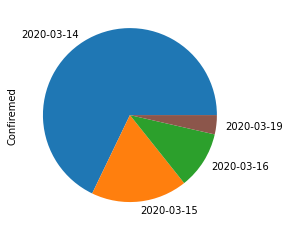

In [46]:
keralahead.plot(kind="pie",labels=labels)
plt.savefig("D:\codes\pie.png")

In [50]:
st['Date_YMD'] = pd.to_datetime(st['Date_YMD'])

In [51]:
st['Month-Year'] = st['Date_YMD'].dt.strftime('%b-%Y')

In [52]:
st

,Confiremed,Deceased,Recovered,Date,Date_YMD,States,value,Month-Year
0,0.0,0.0,0.0,14-Mar-20,2020-03-14,Andaman and Nicobar,0,Mar-2020
1,0.0,0.0,0.0,14-Mar-20,2020-03-14,Andaman and Nicobar,0,Mar-2020
2,0.0,0.0,0.0,14-Mar-20,2020-03-14,Andaman and Nicobar,0,Mar-2020
3,0.0,0.0,0.0,15-Mar-20,2020-03-15,Andaman and Nicobar,0,Mar-2020
4,0.0,0.0,0.0,15-Mar-20,2020-03-15,Andaman and Nicobar,0,Mar-2020
...,...,...,...,...,...,...,...,...
64471,0.0,0.0,880.0,30-Oct-21,2021-10-30,West Bengal,880,Oct-2021
64472,0.0,13.0,0.0,30-Oct-21,2021-10-30,West Bengal,13,Oct-2021
64473,914.0,0.0,0.0,31-Oct-21,2021-10-31,West Bengal,914,Oct-2021
64474,0.0,0.0,913.0,31-Oct-21,2021-10-31,West Bengal,913,Oct-2021


In [54]:
mainRecover=st.loc[ (st["Recovered"] >0)]
mainRecover=pd.DataFrame(mainRecover[["Recovered","Date_YMD"]])
mainRecover=mainRecover.set_index("Date_YMD")
#Recover=Recover.drop(["Confiremed","Deceased"],axis=1)
#Recover=Recover.set_index("Date_YMD")
mainRecover

,Recovered
Date_YMD,
2020-04-09,10.0
2020-04-16,1.0
2020-04-28,4.0
2020-04-30,1.0
2020-05-02,10.0
...,...
2021-10-27,837.0
2021-10-28,845.0
2021-10-29,860.0


In [56]:
mainDeceased=st.loc[ (st["Deceased"] >0)]
mainDeceased=pd.DataFrame(mainDeceased[["Deceased","Date_YMD"]])
mainDeceased=mainDeceased.set_index("Date_YMD")
#Deceased=Deceased.drop(["Confiremed","Recovered"],axis=1)
#Deceased=Deceased.set_index("Date_YMD")
mainDeceased

,Deceased
Date_YMD,
2020-07-27,1.0
2020-07-29,1.0
2020-07-30,1.0
2020-07-31,2.0
2020-08-01,2.0
...,...
2021-10-27,15.0
2021-10-28,9.0
2021-10-29,8.0


In [57]:
mainconfiremed=st.loc[(st["Confiremed"] >0)]
mainconfiremed=pd.DataFrame(mainconfiremed[["Confiremed","Date_YMD"]])
mainconfiremed=mainconfiremed.set_index("Date_YMD")
#confiremed=confiremed.set_index('Date_YMD')
mainconfiremed


,Confiremed
Date_YMD,
2020-03-26,1.0
2020-03-27,5.0
2020-03-28,3.0
2020-03-30,1.0
2020-04-08,1.0
...,...
2021-10-27,976.0
2021-10-28,990.0
2021-10-29,982.0


In [58]:
state=st
state=state.drop(["Date","value","Confiremed","Deceased","Recovered"],axis=1)
state=state.drop_duplicates(subset=["Date_YMD"])
state=state.set_index("Date_YMD")
state

,States,Month-Year
Date_YMD,,
2020-03-14,Andaman and Nicobar,Mar-2020
2020-03-15,Andaman and Nicobar,Mar-2020
2020-03-16,Andaman and Nicobar,Mar-2020
2020-03-17,Andaman and Nicobar,Mar-2020
2020-03-18,Andaman and Nicobar,Mar-2020
...,...,...
2021-10-27,Andaman and Nicobar,Oct-2021
2021-10-28,Andaman and Nicobar,Oct-2021
2021-10-29,Andaman and Nicobar,Oct-2021


In [60]:
final_dataset=pd.concat([state,confiremed,Recover,Deceased],axis=1)
final_dataset=final_dataset.fillna(0)
final_dataset=final_dataset.reset_index()
final_dataset

C:\Users\shine\AppData\Local\Temp/ipykernel_14932/3635418908.py:3: FutureWarning:

Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype=datetime64[ns])



,Date_YMD,States,Month-Year,Confiremed,Recovered,Deceased
0,2020-03-14,Andaman and Nicobar,Mar-2020,0.0,0.0,0.0
1,2020-03-15,Andaman and Nicobar,Mar-2020,0.0,0.0,0.0
2,2020-03-16,Andaman and Nicobar,Mar-2020,0.0,0.0,0.0
3,2020-03-17,Andaman and Nicobar,Mar-2020,0.0,0.0,0.0
4,2020-03-18,Andaman and Nicobar,Mar-2020,0.0,0.0,0.0
...,...,...,...,...,...,...
1187,2020-05-01,0,0,0.0,9.0,0.0
1188,2020-05-03,0,0,0.0,1.0,0.0
1189,2020-05-04,0,0,0.0,61.0,0.0
1190,2020-05-06,0,0,0.0,7.0,0.0


In [69]:
indiaplot=px.scatter(y=final_dataset['Confiremed'],x=final_dataset['Date_YMD'],size=final_dataset["Recovered"],color=final_dataset["Deceased"])
plot.show()

In [80]:
#import os
#path= "D:\codes\github repository\covid-19-analysis-and-forecasting-with-powerbi\covid 19 analysis and forecasting"
#Changing my CWD


#final_dataset.to_csv(os.path.join(path,'statewise PowerBI Raw3 final'))

In [42]:
#final_dataset['Date'] = pd.to_datetime(final_dataset['Date']).dt.date
#final_dataset=final_dataset.groupby(st['Date']).last()


In [43]:
#st.tail()